# Artificial Neural Networks and Deep Learning

---

## Lecture 4b: Transfer Learning and Fine Tuning

<img src="https://drive.google.com/uc?export=view&id=1gsJ4h701PWou3B_JsjbfhIZnefsn2mGN" width="500"/>

## 🌐 Connect Colab to Google Drive

## ⚙️ Import Libraries

In [1]:
# Set seed for reproducibility
seed = 42

# Import necessary libraries
import os

# Set environment variables before importing modules
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'
os.environ['PYTHONHASHSEED'] = str(seed)
os.environ['MPLCONFIGDIR'] = os.getcwd() + '/configs/'

# Suppress warnings
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)
warnings.simplefilter(action='ignore', category=Warning)

# Import necessary modules
import logging
import random
import numpy as np

# Set seeds for random number generators in NumPy and Python
np.random.seed(seed)
random.seed(seed)

# Import TensorFlow and Keras
import tensorflow as tf
from tensorflow import keras as tfk
from tensorflow.keras import layers as tfkl

# Set seed for TensorFlow
tf.random.set_seed(seed)
tf.compat.v1.set_random_seed(seed)

# Reduce TensorFlow verbosity
tf.autograph.set_verbosity(0)
tf.get_logger().setLevel(logging.ERROR)
tf.compat.v1.logging.set_verbosity(tf.compat.v1.logging.ERROR)

# Print TensorFlow version
print(tf.__version__)

# Import other libraries
import requests
from io import BytesIO
import cv2
from PIL import Image
import tensorflow_datasets as tfds
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
import seaborn as sns

# Configure plot display settings
sns.set(font_scale=1.4)
sns.set_style('white')
plt.rc('font', size=14)
%matplotlib inline

2.17.0


## ⏳ Load Data

In [2]:
def load_oxford_pets():
    # Load dataset with TensorFlow Datasets, obtaining dataset info
    dataset, info = tfds.load(
        'oxford_iiit_pet',
        with_info=True,
        as_supervised=True
    )

    # Split dataset into training and test sets
    train_dataset, test_dataset = dataset['train'], dataset['test']

    # Define image preprocessing function
    def preprocess(image, label):
        image = tf.cast(image, tf.float32)
        height = tf.shape(image)[0]
        width = tf.shape(image)[1]
        crop_size = tf.minimum(height, width)
        height_offset = (height - crop_size) // 2
        width_offset = (width - crop_size) // 2

        # Centre-crop and resize image, normalising pixel values
        image = tf.image.crop_to_bounding_box(
            image,
            height_offset,
            width_offset,
            crop_size,
            crop_size
        )
        image = tf.image.resize(image, [128, 128])
        image = image / 255.0
        return image, label

    # Initialise NumPy arrays for training and test sets
    n_train = info.splits['train'].num_examples
    n_test = info.splits['test'].num_examples
    img_shape = (128, 128, 3)

    X_train = np.zeros((n_train, *img_shape), dtype=np.float32)
    y_train = np.zeros(n_train, dtype=np.int64)
    X_test = np.zeros((n_test, *img_shape), dtype=np.float32)
    y_test = np.zeros(n_test, dtype=np.int64)

    # Batch-process and store training data
    train_dataset = train_dataset.map(preprocess).batch(32)
    idx = 0
    for batch_images, batch_labels in train_dataset:
        batch_size = batch_images.shape[0]
        X_train[idx:idx + batch_size] = batch_images.numpy()
        y_train[idx:idx + batch_size] = batch_labels.numpy()
        idx += batch_size

        # Optional: print progress for training data
        if idx % 500 == 0:
            print(f"Processed {idx}/{n_train} training images")

    # Batch-process and store test data
    test_dataset = test_dataset.map(preprocess).batch(32)
    idx = 0
    for batch_images, batch_labels in test_dataset:
        batch_size = batch_images.shape[0]
        X_test[idx:idx + batch_size] = batch_images.numpy()
        y_test[idx:idx + batch_size] = batch_labels.numpy()
        idx += batch_size

        # Optional: print progress for test data
        if idx % 500 == 0:
            print(f"Processed {idx}/{n_test} test images")

    # Retrieve and format class names
    class_names = list(map(str.lower, info.features['label'].names))
    return (X_train, y_train), (X_test, y_test), class_names

# Execute function and load data
(X_train, y_train), (X_test, y_test), class_names = load_oxford_pets()

# Display data shapes for training and test sets
print("Training set shape (images):", X_train.shape)
print("Training set shape (labels):", y_train.shape)
print("Test set shape (images):", X_test.shape)
print("Test set shape (labels):", y_test.shape)

Training set shape (images): (3680, 128, 128, 3)
Training set shape (labels): (3680,)
Test set shape (images): (3669, 128, 128, 3)
Test set shape (labels): (3669,)


## 🔎 Inspect Data

In [3]:
# Number of images to display
num_img = 10

# Select random indices from the training set
random_indices = random.sample(range(len(X_train)), num_img)

# Create subplot layout for images
fig, axes = plt.subplots(2, num_img // 2, figsize=(20, 9))

for i, idx in enumerate(random_indices):
    ax = axes[i // 5, i % 5]

    # Display the image at the selected index
    ax.imshow(X_train[idx])

    # Add class name as title, formatting it to replace underscores with spaces and capitalise
    class_name = class_names[y_train[idx]]
    class_name = class_name.replace('_', ' ').title()
    ax.set_title(class_name, pad=5)

    # Remove axis lines for clearer display
    ax.axis('off')

# Adjust layout for better spacing
plt.tight_layout()
plt.show()

Output hidden; open in https://colab.research.google.com to view.

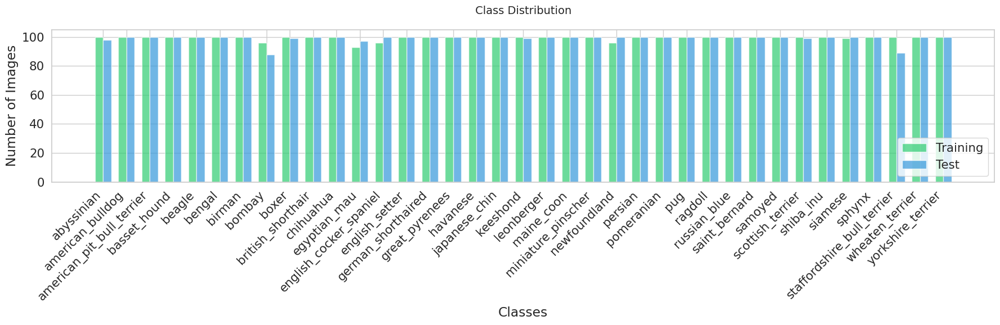

In [4]:
def plot_class_distribution(y_train, y_test, class_names):
    # Set seaborn style for the plot
    sns.set_style("whitegrid")
    plt.figure(figsize=(18, 6))

    # Calculate class distributions for training and test sets
    train_dist = np.bincount(y_train)
    test_dist = np.bincount(y_test)

    # Create x positions and set bar width
    x = np.arange(len(class_names))
    width = 0.35

    # Plot bars for training and test distributions
    plt.bar(x - width / 2, train_dist, width, label='Training', color='#2ecc71', alpha=0.7)
    plt.bar(x + width / 2, test_dist, width, label='Test', color='#3498db', alpha=0.7)

    # Customise plot title and labels
    plt.title('Class Distribution', pad=20, fontsize=14)
    plt.xlabel('Classes')
    plt.ylabel('Number of Images')

    # Set class names as x-axis labels with rotation
    plt.xticks(x, class_names, rotation=45, ha='right')

    # Add legend for training and test distributions
    plt.legend(loc='lower right')

    # Adjust layout for optimal spacing
    plt.tight_layout()
    plt.show()

# Execute function to plot class distribution
plot_class_distribution(y_train, y_test, class_names)

In [5]:
# Split test set into validation and test sets with stratification
X_val, X_test, y_val, y_test = train_test_split(X_test, y_test, random_state=seed, test_size=0.5, stratify=y_test)

# Convert class labels to categorical format for training, validation, and test sets
y_train = tfk.utils.to_categorical(y_train, num_classes=len(class_names))
y_val = tfk.utils.to_categorical(y_val, num_classes=len(class_names))
y_test = tfk.utils.to_categorical(y_test, num_classes=len(class_names))

# Print shapes of the datasets
print(f"X_train shape: {X_train.shape}, y_train shape: {y_train.shape}")
print(f"X_val shape: {X_val.shape}, y_val shape: {y_val.shape}")
print(f"X_test shape: {X_test.shape}, y_test shape: {y_test.shape}")

X_train shape: (3680, 128, 128, 3), y_train shape: (3680, 37)
X_val shape: (1834, 128, 128, 3), y_val shape: (1834, 37)
X_test shape: (1835, 128, 128, 3), y_test shape: (1835, 37)


## 🛠️ Train MobileNetV3Small from scratch

Model: "MobileNetV3Small"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)  │ (None, 128, 128, 3)    │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ rescaling (Rescaling)     │ (None, 128, 128, 3)    │              0 │ input_layer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv (Conv2D)             │ (None, 64, 64, 16)     │            432 │ rescaling[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv_bn                   │ (None, 64, 64, 16)     │             64 │ conv[0][0]             │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation (Activation)   │ (None, 64, 64, 16)     │              0 │ conv_bn[0][0]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ expanded_conv_depthwise_… │ (None, 65, 65, 16)     │              0 │ activation[0][0]       │
│ (ZeroPadding2D)           │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ expanded_conv_depthwise   │ (None, 32, 32, 16)     │            144 │ expanded_conv_depthwi… │
│ (DepthwiseConv2D)         │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ expanded_conv_depthwise_… │ (None, 32, 32, 16)     │             64 │ expanded_conv_depthwi… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ re_lu (ReLU)              │ (None, 32, 32, 16)     │              0 │ expanded_conv_depthwi… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ expanded_conv_squeeze_ex… │ (None, 1, 1, 16)       │              0 │ re_lu[0][0]            │
│ (GlobalAveragePooling2D)  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ expanded_conv_squeeze_ex… │ (None, 1, 1, 8)        │            136 │ expanded_conv_squeeze… │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ expanded_conv_squeeze_ex… │ (None, 1, 1, 8)        │              0 │ expanded_conv_squeeze… │
│ (ReLU)                    │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ expanded_conv_squeeze_ex… │ (None, 1, 1, 16)       │            144 │ expanded_conv_squeeze… │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ add (Add)                 │ (None, 1, 1, 16)       │              0 │ expanded_conv_squeeze… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ re_lu_1 (ReLU)            │ (None, 1, 1, 16)       │              0 │ add[0][0]              │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ multiply (Multiply)  

 Total params: 939,120 (3.58 MB)

 Trainable params: 927,008 (3.54 MB)

 Non-trainable params: 12,112 (47.31 KB)

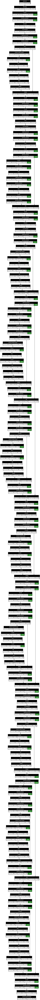

In [6]:
# Initialise MobileNetV3Small model without pretrained weights, for custom training
mobilenet = tfk.applications.MobileNetV3Small(
    input_shape=(128, 128, 3),
    include_top=False,
    weights=None,
    pooling='avg',
    include_preprocessing=True
)

# Display a summary of the model architecture
mobilenet.summary(expand_nested=True)

# Display model architecture with layer shapes and trainable parameters
tfk.utils.plot_model(mobilenet, expand_nested=True, show_trainable=True, show_shapes=True, dpi=70)

Model: "model"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)             │ (None, 128, 128, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ preprocessing (Sequential)           │ (None, 128, 128, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ random_flip_2 (RandomFlip)      │ (None, 128, 128, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ random_translation_2            │ (None, 128, 128, 3)         │               0 │
│ (RandomTranslation)                  │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ MobileNetV3Small (Functional)        │ (None, 576)                 │         939,120 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ input_layer_2 (InputLayer)      │ (None, 128, 128, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ rescaling_1 (Rescaling)         │ (None, 128, 128, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ conv (Conv2D)                   │ (None, 64, 64, 16)          │             432 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ conv_bn (BatchNormalization)    │ (None, 64, 64, 16)          │              64 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ activation_18 (Activation)      │ (None, 64, 64, 16)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ expanded_conv_depthwise_pad     │ (None, 65, 65, 16)          │               0 │
│ (ZeroPadding2D)                      │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ expanded_conv_depthwise         │ (None, 32, 32, 16)          │             144 │
│ (DepthwiseConv2D)                    │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ expanded_conv_depthwise_bn      │ (None, 32, 32, 16)          │              64 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ re_lu_14 (ReLU)                 │ (None, 32, 32, 16)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └                                 │ (None, 1, 1, 16)            │               0 │
│ expanded_conv_squeeze_excite_avg_po… │                             │                 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └                                 │ (None, 1, 1, 8)             │             136 │
│ expanded_conv_squeeze_excite_conv    │                             │                 │
│ (Conv2D)                             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └                                 │ (None, 1, 1, 8)             │               0 │
│ expanded_conv_squeeze_excite_relu    │                             │              

 Total params: 960,469 (3.66 MB)

 Trainable params: 21,349 (83.39 KB)

 Non-trainable params: 939,120 (3.58 MB)

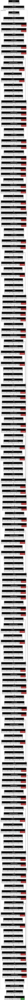

In [26]:
# Create an input layer with shape (128, 128, 3)
inputs = tfk.Input(shape=(128, 128, 3), name='input_layer')

augmentation = tf.keras.Sequential([
    tfkl.RandomFlip("horizontal"),
    tfkl.RandomTranslation(0.2,0.2)
], name='preprocessing')

x = augmentation(inputs)

# Connect MobileNetV3Small to the input
x = mobilenet(x)

x = tfkl.Dropout(0.3, name='dropout')(x)

# Add a Dense layer with 2 units and softmax activation as the classifier
outputs = tfkl.Dense(y_train.shape[-1], activation='softmax', name='dense')(x)

# Create a Model connecting input and output
model = tfk.Model(inputs=inputs, outputs=outputs, name='model')

# Compile the model with Categorical Cross-Entropy loss and Adam optimizer
model.compile(loss=tfk.losses.CategoricalCrossentropy(), optimizer=tfk.optimizers.Adam(), metrics=['accuracy'])

# Display a summary of the model architecture
model.summary(expand_nested=True)

# Display model architecture with layer shapes and trainable parameters
tfk.utils.plot_model(model, expand_nested=True, show_trainable=True, show_shapes=True, dpi=70)

In [27]:
# Train the model
history = model.fit(
    x = X_train*255,
    y = y_train,
    batch_size = 64,
    epochs = 200,
    validation_data = (X_val*255, y_val),
    callbacks = [tfk.callbacks.EarlyStopping(monitor='val_accuracy', mode='max', patience=10, restore_best_weights=True)]
).history

# Calculate and print the final validation accuracy
final_val_accuracy = round(max(history['val_accuracy'])* 100, 2)
print(f'Final validation accuracy: {final_val_accuracy}%')

# Save the trained model to a file with the accuracy included in the filename
model_filename = 'Pets_EfficientNetV2B0_'+str(final_val_accuracy)+'.keras'
model.save(model_filename)

# Delete the model to free up resources
del model

# Need Warmup

Epoch 1/200
58/58 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - accuracy: 0.0771 - loss: 3.9017 - val_accuracy: 0.4117 - val_loss: 2.1967
Epoch 2/200
58/58 ━━━━━━━━━━━━━━━━━━━━ 2s 34ms/step - accuracy: 0.3402 - loss: 2.2660 - val_accuracy: 0.5780 - val_loss: 1.5337
Epoch 3/200
58/58 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step - accuracy: 0.4828 - loss: 1.7374 - val_accuracy: 0.6358 - val_loss: 1.2740
Epoch 4/200
58/58 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - accuracy: 0.5670 - loss: 1.4426 - val_accuracy: 0.6614 - val_loss: 1.1465
Epoch 5/200
58/58 ━━━━━━━━━━━━━━━━━━━━ 2s 32ms/step - accuracy: 0.6109 - loss: 1.2924 - val_accuracy: 0.6827 - val_loss: 1.0653
Epoch 6/200
58/58 ━━━━━━━━━━━━━━━━━━━━ 3s 35ms/step - accuracy: 0.6317 - loss: 1.1974 - val_accuracy: 0.6941 - val_loss: 1.0152
Epoch 7/200
58/58 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - accuracy: 0.6647 - loss: 1.1159 - val_accuracy: 0.6996 - val_loss: 0.9769
Epoch 8/200
58/58 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step - accuracy: 0.6916 - loss: 1.0136 - val_accuracy: 0.

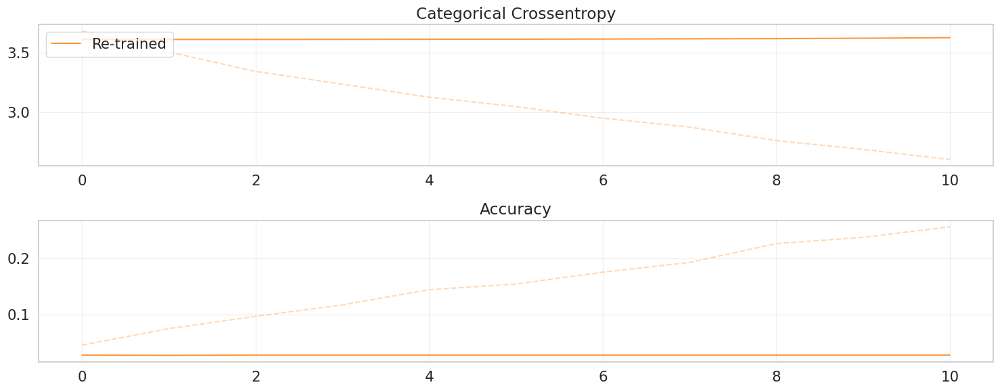

In [9]:
# Create figure and subplots
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(15, 6))

# Plot loss in first subplot
ax1.plot(history['loss'], alpha=.3, color='#ff7f0e', linestyle='--')
ax1.plot(history['val_loss'], label='Re-trained', alpha=.8, color='#ff7f0e')
ax1.set_title('Categorical Crossentropy')
ax1.legend(loc='upper left')
ax1.grid(alpha=.3)

# Plot accuracy in second subplot
ax2.plot(history['accuracy'], alpha=.3, color='#ff7f0e', linestyle='--')
ax2.plot(history['val_accuracy'], label='Re-trained', alpha=.8, color='#ff7f0e')
ax2.set_title('Accuracy')
ax2.grid(alpha=.3)

# Adjust layout to prevent overlapping
plt.tight_layout()
plt.show()

## 🛠️ Transfer Learning

<img src="https://radekosmulski.com/content/images/2021/08/imagenet_banner.jpeg" width="700"/>



Model: "MobileNetV3Small"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_2             │ (None, 128, 128, 3)    │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ rescaling_1 (Rescaling)   │ (None, 128, 128, 3)    │              0 │ input_layer_2[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv (Conv2D)             │ (None, 64, 64, 16)     │            432 │ rescaling_1[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv_bn                   │ (None, 64, 64, 16)     │             64 │ conv[0][0]             │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_18             │ (None, 64, 64, 16)     │              0 │ conv_bn[0][0]          │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ expanded_conv_depthwise_… │ (None, 65, 65, 16)     │              0 │ activation_18[0][0]    │
│ (ZeroPadding2D)           │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ expanded_conv_depthwise   │ (None, 32, 32, 16)     │            144 │ expanded_conv_depthwi… │
│ (DepthwiseConv2D)         │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ expanded_conv_depthwise_… │ (None, 32, 32, 16)     │             64 │ expanded_conv_depthwi… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ re_lu_14 (ReLU)           │ (None, 32, 32, 16)     │              0 │ expanded_conv_depthwi… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ expanded_conv_squeeze_ex… │ (None, 1, 1, 16)       │              0 │ re_lu_14[0][0]         │
│ (GlobalAveragePooling2D)  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ expanded_conv_squeeze_ex… │ (None, 1, 1, 8)        │            136 │ expanded_conv_squeeze… │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ expanded_conv_squeeze_ex… │ (None, 1, 1, 8)        │              0 │ expanded_conv_squeeze… │
│ (ReLU)                    │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ expanded_conv_squeeze_ex… │ (None, 1, 1, 16)       │            144 │ expanded_conv_squeeze… │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ add_9 (Add)               │ (None, 1, 1, 16)       │              0 │ expanded_conv_squeeze… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ re_lu_15 (ReLU)      

 Total params: 939,120 (3.58 MB)

 Trainable params: 927,008 (3.54 MB)

 Non-trainable params: 12,112 (47.31 KB)

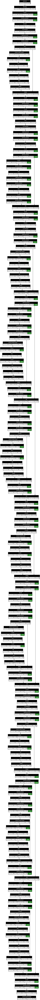

In [10]:
# Initialise MobileNetV3Small model with pretrained weights, for transfer learning
mobilenet = tfk.applications.MobileNetV3Small(
    input_shape=(128, 128, 3),
    include_top=False,
    weights='imagenet',
    pooling='avg',
    include_preprocessing=True
)

# Display a summary of the model architecture
mobilenet.summary(expand_nested=True)

# Display model architecture with layer shapes and trainable parameters
tfk.utils.plot_model(mobilenet, expand_nested=True, show_trainable=True, show_shapes=True, dpi=70)

<img src="https://drive.google.com/uc?export=view&id=1OYCCe7eQSSiscBZC1gc1TmIMOjN8R-Qk" width="800"/>

Model: "model"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)             │ (None, 128, 128, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ preprocessing (Sequential)           │ (None, 128, 128, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ random_flip_1 (RandomFlip)      │ (None, 128, 128, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ random_translation_1            │ (None, 128, 128, 3)         │               0 │
│ (RandomTranslation)                  │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ MobileNetV3Small (Functional)        │ (None, 576)                 │         939,120 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ input_layer_2 (InputLayer)      │ (None, 128, 128, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ rescaling_1 (Rescaling)         │ (None, 128, 128, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ conv (Conv2D)                   │ (None, 64, 64, 16)          │             432 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ conv_bn (BatchNormalization)    │ (None, 64, 64, 16)          │              64 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ activation_18 (Activation)      │ (None, 64, 64, 16)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ expanded_conv_depthwise_pad     │ (None, 65, 65, 16)          │               0 │
│ (ZeroPadding2D)                      │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ expanded_conv_depthwise         │ (None, 32, 32, 16)          │             144 │
│ (DepthwiseConv2D)                    │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ expanded_conv_depthwise_bn      │ (None, 32, 32, 16)          │              64 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ re_lu_14 (ReLU)                 │ (None, 32, 32, 16)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └                                 │ (None, 1, 1, 16)            │               0 │
│ expanded_conv_squeeze_excite_avg_po… │                             │                 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └                                 │ (None, 1, 1, 8)             │             136 │
│ expanded_conv_squeeze_excite_conv    │                             │                 │
│ (Conv2D)                             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └                                 │ (None, 1, 1, 8)             │               0 │
│ expanded_conv_squeeze_excite_relu    │                             │              

 Total params: 960,469 (3.66 MB)

 Trainable params: 21,349 (83.39 KB)

 Non-trainable params: 939,120 (3.58 MB)

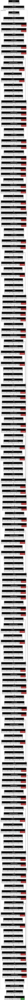

In [11]:
# Freeze all layers in MobileNetV3Small to use it solely as a feature extractor
mobilenet.trainable = False

# Define input layer with shape matching the input images
inputs = tfk.Input(shape=(128, 128, 3), name='input_layer')

# Apply data augmentation for training robustness
augmentation = tf.keras.Sequential([
    tfkl.RandomFlip("horizontal"),
    tfkl.RandomTranslation(0.2, 0.2)
], name='preprocessing')

x = augmentation(inputs)

# Pass augmented inputs through the MobileNetV3Small feature extractor
x = mobilenet(x)

# Add a dropout layer for regularisation
x = tfkl.Dropout(0.3, name='dropout')(x)

# Add final Dense layer for classification with softmax activation
outputs = tfkl.Dense(y_train.shape[-1], activation='softmax', name='dense')(x)

# Define the complete model linking input and output
tl_model = tfk.Model(inputs=inputs, outputs=outputs, name='model')

# Compile the model with categorical cross-entropy loss and Adam optimiser
tl_model.compile(loss=tfk.losses.CategoricalCrossentropy(), optimizer=tfk.optimizers.Adam(), metrics=['accuracy'])

# Display a summary of the model architecture
tl_model.summary(expand_nested=True)

# Display model architecture with layer shapes and trainable parameters
tfk.utils.plot_model(tl_model, expand_nested=True, show_trainable=True, show_shapes=True, dpi=70)

In [12]:
# Train the model
tl_history = tl_model.fit(
    x=X_train * 255,
    y=y_train,
    batch_size=64,
    epochs=200,
    validation_data=(X_val * 255, y_val),
    callbacks=[tfk.callbacks.EarlyStopping(monitor='val_accuracy', mode='max', patience=20, restore_best_weights=True)]
).history

# Calculate and print the best validation accuracy achieved
final_val_accuracy = round(max(tl_history['val_accuracy']) * 100, 2)
print(f'Final validation accuracy: {final_val_accuracy}%')

# Save the trained model to a file, including final accuracy in the filename
model_filename = 'Pets_MobileNetV3S_' + str(final_val_accuracy) + '.keras'
tl_model.save(model_filename)

# Free memory by deleting the model instance
del tl_model

Epoch 1/200
58/58 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - accuracy: 0.0726 - loss: 3.8048 - val_accuracy: 0.4057 - val_loss: 2.1497
Epoch 2/200
58/58 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - accuracy: 0.3617 - loss: 2.2166 - val_accuracy: 0.5682 - val_loss: 1.5161
Epoch 3/200
58/58 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - accuracy: 0.5152 - loss: 1.6589 - val_accuracy: 0.6336 - val_loss: 1.2653
Epoch 4/200
58/58 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step - accuracy: 0.5938 - loss: 1.4069 - val_accuracy: 0.6690 - val_loss: 1.1280
Epoch 5/200
58/58 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step - accuracy: 0.6239 - loss: 1.2460 - val_accuracy: 0.6821 - val_loss: 1.0535
Epoch 6/200
58/58 ━━━━━━━━━━━━━━━━━━━━ 3s 32ms/step - accuracy: 0.6485 - loss: 1.1543 - val_accuracy: 0.7007 - val_loss: 0.9997
Epoch 7/200
58/58 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step - accuracy: 0.6833 - loss: 1.1064 - val_accuracy: 0.7083 - val_loss: 0.9637
Epoch 8/200
58/58 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - accuracy: 0.6870 - loss: 1.0394 - val_accuracy: 0

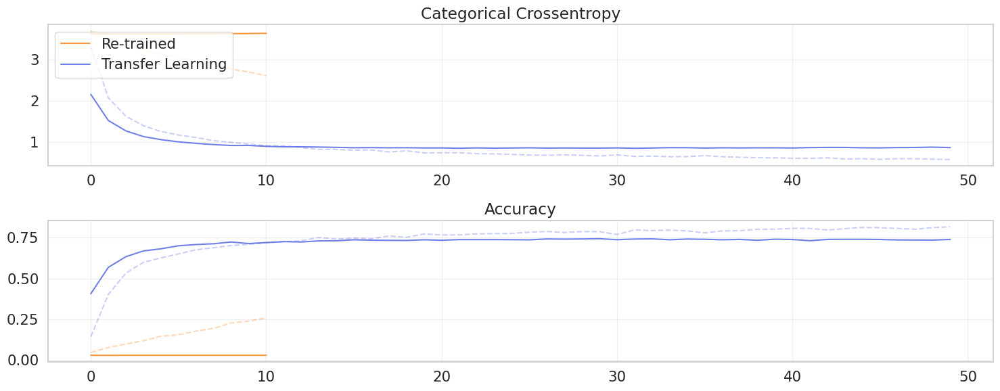

In [13]:
# Create figure and subplots for loss and accuracy
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(15, 6))

# Plot loss for both re-trained and transfer learning models
ax1.plot(history['loss'], alpha=0.3, color='#ff7f0e', linestyle='--')
ax1.plot(history['val_loss'], label='Re-trained', alpha=0.8, color='#ff7f0e')
ax1.plot(tl_history['loss'], alpha=0.3, color='#4D61E2', linestyle='--')
ax1.plot(tl_history['val_loss'], label='Transfer Learning', alpha=0.8, color='#4D61E2')
ax1.set_title('Categorical Crossentropy')
ax1.legend(loc='upper left')
ax1.grid(alpha=0.3)

# Plot accuracy for both re-trained and transfer learning models
ax2.plot(history['accuracy'], alpha=0.3, color='#ff7f0e', linestyle='--')
ax2.plot(history['val_accuracy'], label='Re-trained', alpha=0.8, color='#ff7f0e')
ax2.plot(tl_history['accuracy'], alpha=0.3, color='#4D61E2', linestyle='--')
ax2.plot(tl_history['val_accuracy'], label='Transfer Learning', alpha=0.8, color='#4D61E2')
ax2.set_title('Accuracy')
ax2.grid(alpha=0.3)

# Adjust layout to prevent label overlap and display the plots
plt.tight_layout()
plt.show()

## 🛠️ Fine Tuning

<img src="https://www.researchgate.net/publication/359405075/figure/fig2/AS:1182999492214798@1659060466845/Concept-of-fine-tuning-and-feature-extraction_W640.jpg" width="700"/>




Model: "model"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)             │ (None, 128, 128, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ preprocessing (Sequential)           │ (None, 128, 128, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ random_flip_1 (RandomFlip)      │ (None, 128, 128, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ random_translation_1            │ (None, 128, 128, 3)         │               0 │
│ (RandomTranslation)                  │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ MobileNetV3Small (Functional)        │ (None, 576)                 │         939,120 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ input_layer_2 (InputLayer)      │ (None, 128, 128, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ rescaling_1 (Rescaling)         │ (None, 128, 128, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ conv (Conv2D)                   │ (None, 64, 64, 16)          │             432 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ conv_bn (BatchNormalization)    │ (None, 64, 64, 16)          │              64 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ activation_18 (Activation)      │ (None, 64, 64, 16)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ expanded_conv_depthwise_pad     │ (None, 65, 65, 16)          │               0 │
│ (ZeroPadding2D)                      │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ expanded_conv_depthwise         │ (None, 32, 32, 16)          │             144 │
│ (DepthwiseConv2D)                    │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ expanded_conv_depthwise_bn      │ (None, 32, 32, 16)          │              64 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ re_lu_14 (ReLU)                 │ (None, 32, 32, 16)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └                                 │ (None, 1, 1, 16)            │               0 │
│ expanded_conv_squeeze_excite_avg_po… │                             │                 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └                                 │ (None, 1, 1, 8)             │             136 │
│ expanded_conv_squeeze_excite_conv    │                             │                 │
│ (Conv2D)                             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └                                 │ (None, 1, 1, 8)             │               0 │
│ expanded_conv_squeeze_excite_relu    │                             │              

 Total params: 1,003,169 (3.83 MB)

 Trainable params: 21,349 (83.39 KB)

 Non-trainable params: 939,120 (3.58 MB)

 Optimizer params: 42,700 (166.80 KB)

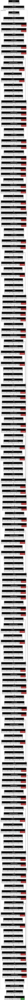

In [14]:
# Re-load the model after transfer learning
ft_model = tfk.models.load_model('Pets_MobileNetV3S_74.43.keras')

# Display a summary of the model architecture
ft_model.summary(expand_nested=True)

# Display model architecture with layer shapes and trainable parameters
tfk.utils.plot_model(ft_model, expand_nested=True, show_trainable=True, show_shapes=True, dpi=70)

In [15]:
# Set the MobileNetV3Small model layers as trainable
ft_model.get_layer('MobileNetV3Small').trainable = True

# Set all MobileNetV3Small layers as non-trainable
for layer in ft_model.get_layer('MobileNetV3Small').layers:
    layer.trainable = False

# Enable training only for Conv2D and DepthwiseConv2D layers
for i, layer in enumerate(ft_model.get_layer('MobileNetV3Small').layers):
    if isinstance(layer, tf.keras.layers.Conv2D) or isinstance(layer, tf.keras.layers.DepthwiseConv2D):
        layer.trainable = True
        print(i, layer.name, type(layer).__name__, layer.trainable)

2 conv Conv2D True
6 expanded_conv_depthwise DepthwiseConv2D True
10 expanded_conv_squeeze_excite_conv Conv2D True
12 expanded_conv_squeeze_excite_conv_1 Conv2D True
15 expanded_conv_project Conv2D True
17 expanded_conv_1_expand Conv2D True
21 expanded_conv_1_depthwise DepthwiseConv2D True
24 expanded_conv_1_project Conv2D True
26 expanded_conv_2_expand Conv2D True
29 expanded_conv_2_depthwise DepthwiseConv2D True
32 expanded_conv_2_project Conv2D True
35 expanded_conv_3_expand Conv2D True
39 expanded_conv_3_depthwise DepthwiseConv2D True
43 expanded_conv_3_squeeze_excite_conv Conv2D True
45 expanded_conv_3_squeeze_excite_conv_1 Conv2D True
48 expanded_conv_3_project Conv2D True
50 expanded_conv_4_expand Conv2D True
53 expanded_conv_4_depthwise DepthwiseConv2D True
57 expanded_conv_4_squeeze_excite_conv Conv2D True
59 expanded_conv_4_squeeze_excite_conv_1 Conv2D True
62 expanded_conv_4_project Conv2D True
65 expanded_conv_5_expand Conv2D True
68 expanded_conv_5_depthwise DepthwiseConv2

0 input_layer_2 False
1 rescaling_1 False
2 conv False
3 conv_bn False
4 activation_18 False
5 expanded_conv_depthwise_pad False
6 expanded_conv_depthwise False
7 expanded_conv_depthwise_bn False
8 re_lu_14 False
9 expanded_conv_squeeze_excite_avg_pool False
10 expanded_conv_squeeze_excite_conv False
11 expanded_conv_squeeze_excite_relu False
12 expanded_conv_squeeze_excite_conv_1 False
13 re_lu_15 False
14 expanded_conv_squeeze_excite_mul False
15 expanded_conv_project False
16 expanded_conv_project_bn False
17 expanded_conv_1_expand False
18 expanded_conv_1_expand_bn False
19 re_lu_16 False
20 expanded_conv_1_depthwise_pad False
21 expanded_conv_1_depthwise False
22 expanded_conv_1_depthwise_bn False
23 re_lu_17 False
24 expanded_conv_1_project False
25 expanded_conv_1_project_bn False
26 expanded_conv_2_expand False
27 expanded_conv_2_expand_bn False
28 re_lu_18 False
29 expanded_conv_2_depthwise False
30 expanded_conv_2_depthwise_bn False
31 re_lu_19 False
32 expanded_conv_2_projec

Model: "model"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)             │ (None, 128, 128, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ preprocessing (Sequential)           │ (None, 128, 128, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ random_flip_1 (RandomFlip)      │ (None, 128, 128, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ random_translation_1            │ (None, 128, 128, 3)         │               0 │
│ (RandomTranslation)                  │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ MobileNetV3Small (Functional)        │ (None, 576)                 │         939,120 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ input_layer_2 (InputLayer)      │ (None, 128, 128, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ rescaling_1 (Rescaling)         │ (None, 128, 128, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ conv (Conv2D)                   │ (None, 64, 64, 16)          │             432 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ conv_bn (BatchNormalization)    │ (None, 64, 64, 16)          │              64 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ activation_18 (Activation)      │ (None, 64, 64, 16)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ expanded_conv_depthwise_pad     │ (None, 65, 65, 16)          │               0 │
│ (ZeroPadding2D)                      │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ expanded_conv_depthwise         │ (None, 32, 32, 16)          │             144 │
│ (DepthwiseConv2D)                    │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ expanded_conv_depthwise_bn      │ (None, 32, 32, 16)          │              64 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ re_lu_14 (ReLU)                 │ (None, 32, 32, 16)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └                                 │ (None, 1, 1, 16)            │               0 │
│ expanded_conv_squeeze_excite_avg_po… │                             │                 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └                                 │ (None, 1, 1, 8)             │             136 │
│ expanded_conv_squeeze_excite_conv    │                             │                 │
│ (Conv2D)                             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └                                 │ (None, 1, 1, 8)             │               0 │
│ expanded_conv_squeeze_excite_relu    │                             │              

 Total params: 1,003,169 (3.83 MB)

 Trainable params: 659,845 (2.52 MB)

 Non-trainable params: 300,624 (1.15 MB)

 Optimizer params: 42,700 (166.80 KB)

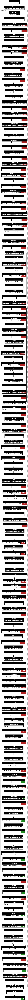

In [16]:
# Set the number of layers to freeze
N = 124

# Set the first N layers as non-trainable
for i, layer in enumerate(ft_model.get_layer('MobileNetV3Small').layers[:N]):
    layer.trainable = False

# Print layer indices, names, and trainability status
for i, layer in enumerate(ft_model.get_layer('MobileNetV3Small').layers):
    print(i, layer.name, layer.trainable)

# Display a summary of the model architecture
ft_model.summary(expand_nested=True)

# Display model architecture with layer shapes and trainable parameters
tfk.utils.plot_model(ft_model, expand_nested=True, show_trainable=True, show_shapes=True, dpi=70)

In [17]:
# Compile the model
ft_model.compile(loss=tfk.losses.CategoricalCrossentropy(), optimizer=tfk.optimizers.Adam(1e-4), metrics=['accuracy'])

In [18]:
# Fine-tune the model
ft_history = ft_model.fit(
    x = X_train*255,
    y = y_train,
    batch_size = 64,
    epochs = 200,
    validation_data = (X_val*255, y_val),
    callbacks = [tfk.callbacks.EarlyStopping(monitor='val_accuracy', mode='max', patience=20, restore_best_weights=True)]
).history

# Calculate and print the final validation accuracy
final_val_accuracy = round(max(ft_history['val_accuracy'])* 100, 2)
print(f'Final validation accuracy: {final_val_accuracy}%')

# Save the trained model to a file with the accuracy included in the filename
model_filename = 'Pets_MobileNetV3S_FT_'+str(final_val_accuracy)+'.keras'
ft_model.save(model_filename)

# Delete the model to free up resources
del ft_model

Epoch 1/200
58/58 ━━━━━━━━━━━━━━━━━━━━ 13s 84ms/step - accuracy: 0.8010 - loss: 0.6179 - val_accuracy: 0.7475 - val_loss: 0.8273
Epoch 2/200
58/58 ━━━━━━━━━━━━━━━━━━━━ 3s 44ms/step - accuracy: 0.8208 - loss: 0.5753 - val_accuracy: 0.7508 - val_loss: 0.8109
Epoch 3/200
58/58 ━━━━━━━━━━━━━━━━━━━━ 3s 43ms/step - accuracy: 0.8267 - loss: 0.5448 - val_accuracy: 0.7579 - val_loss: 0.8010
Epoch 4/200
58/58 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step - accuracy: 0.8327 - loss: 0.5126 - val_accuracy: 0.7563 - val_loss: 0.8030
Epoch 5/200
58/58 ━━━━━━━━━━━━━━━━━━━━ 4s 44ms/step - accuracy: 0.8445 - loss: 0.4794 - val_accuracy: 0.7557 - val_loss: 0.8095
Epoch 6/200
58/58 ━━━━━━━━━━━━━━━━━━━━ 3s 44ms/step - accuracy: 0.8531 - loss: 0.4650 - val_accuracy: 0.7612 - val_loss: 0.8114
Epoch 7/200
58/58 ━━━━━━━━━━━━━━━━━━━━ 6s 64ms/step - accuracy: 0.8466 - loss: 0.4560 - val_accuracy: 0.7557 - val_loss: 0.8204
Epoch 8/200
58/58 ━━━━━━━━━━━━━━━━━━━━ 4s 44ms/step - accuracy: 0.8599 - loss: 0.4337 - val_accuracy: 0

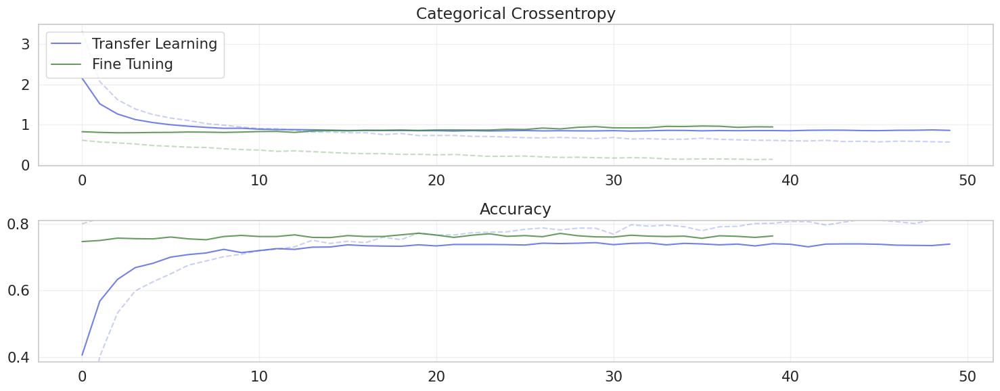

In [19]:
# Create figure and subplots for loss and accuracy
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(15, 6))

# Plot categorical cross-entropy loss for both Transfer Learning and Fine Tuning stages
ax1.plot(tl_history['loss'], alpha=0.3, color='#4D61E2', linestyle='--')
ax1.plot(tl_history['val_loss'], label='Transfer Learning', alpha=0.8, color='#4D61E2')
ax1.plot(ft_history['loss'], alpha=0.3, color='#408537', linestyle='--')
ax1.plot(ft_history['val_loss'], label='Fine Tuning', alpha=0.8, color='#408537')
ax1.set_title('Categorical Crossentropy')
ax1.legend(loc='upper left')
ax1.grid(alpha=0.3)

# Plot accuracy for both Transfer Learning and Fine Tuning stages
ax2.plot(tl_history['accuracy'], alpha=0.3, color='#4D61E2', linestyle='--')
ax2.plot(tl_history['val_accuracy'], label='Transfer Learning', alpha=0.8, color='#4D61E2')
ax2.plot(ft_history['accuracy'], alpha=0.3, color='#408537', linestyle='--')
ax2.plot(ft_history['val_accuracy'], label='Fine Tuning', alpha=0.8, color='#408537')
ax2.set_title('Accuracy')
ax2.set_ylim([min(tl_history['val_accuracy']) * 0.95, max(ft_history['val_accuracy']) * 1.05])
ax2.grid(alpha=0.3)

# Adjust layout to prevent overlap and display the plots
plt.tight_layout()
plt.show()

## 🕹️ Use the Model - Make Inference

Model: "model"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)             │ (None, 128, 128, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ preprocessing (Sequential)           │ (None, 128, 128, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ random_flip_1 (RandomFlip)      │ (None, 128, 128, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ random_translation_1            │ (None, 128, 128, 3)         │               0 │
│ (RandomTranslation)                  │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ MobileNetV3Small (Functional)        │ (None, 576)                 │         939,120 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ input_layer_2 (InputLayer)      │ (None, 128, 128, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ rescaling_1 (Rescaling)         │ (None, 128, 128, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ conv (Conv2D)                   │ (None, 64, 64, 16)          │             432 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ conv_bn (BatchNormalization)    │ (None, 64, 64, 16)          │              64 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ activation_18 (Activation)      │ (None, 64, 64, 16)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ expanded_conv_depthwise_pad     │ (None, 65, 65, 16)          │               0 │
│ (ZeroPadding2D)                      │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ expanded_conv_depthwise         │ (None, 32, 32, 16)          │             144 │
│ (DepthwiseConv2D)                    │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ expanded_conv_depthwise_bn      │ (None, 32, 32, 16)          │              64 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ re_lu_14 (ReLU)                 │ (None, 32, 32, 16)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └                                 │ (None, 1, 1, 16)            │               0 │
│ expanded_conv_squeeze_excite_avg_po… │                             │                 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └                                 │ (None, 1, 1, 8)             │             136 │
│ expanded_conv_squeeze_excite_conv    │                             │                 │
│ (Conv2D)                             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └                                 │ (None, 1, 1, 8)             │               0 │
│ expanded_conv_squeeze_excite_relu    │                             │              

 Total params: 2,280,161 (8.70 MB)

 Trainable params: 659,845 (2.52 MB)

 Non-trainable params: 300,624 (1.15 MB)

 Optimizer params: 1,319,692 (5.03 MB)

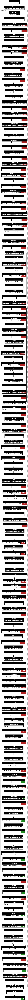

In [23]:
# Load the fine-tuned MobileNetV3 model for prediction on external images
ft_bn_model = tfk.models.load_model('Pets_MobileNetV3S_FT_77.26.keras')

# Display a summary of the model architecture
ft_bn_model.summary(expand_nested=True)

# Display model architecture with layer shapes and trainable parameters
tfk.utils.plot_model(ft_bn_model, expand_nested=True, show_trainable=True, show_shapes=True, dpi=70)

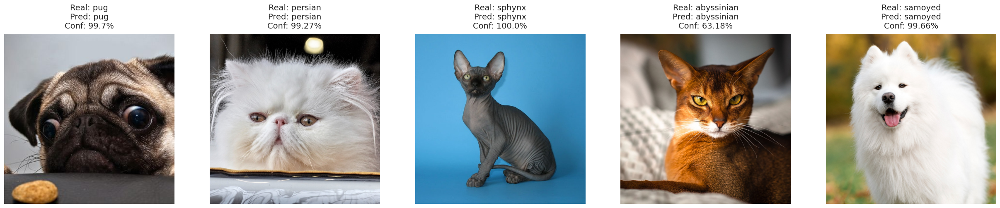

In [24]:
def crop_square(image):
    """Crop image to a square, centred on the middle section"""
    image = tf.cast(image, tf.float32)
    height = tf.shape(image)[0]
    width = tf.shape(image)[1]
    crop_size = tf.minimum(height, width)
    height_offset = (height - crop_size) // 2
    width_offset = (width - crop_size) // 2

    image = tf.image.crop_to_bounding_box(
        image,
        height_offset,
        width_offset,
        crop_size,
        crop_size
    )
    return image

def preprocess_for_model(image):
    """Resize image to match model input requirements"""
    image = tf.image.resize(image, [128, 128])
    return image

# Dictionary of image URLs and their actual classes
images = {
    'pug': 'https://blog.expodog.com/wp-content/uploads/2020/09/f896a647cfc5346c5b042a6a1e916065.jpg',
    'persian': 'https://images.squarespace-cdn.com/content/v1/5b1cc0f95b409bd4bfc3b316/1687322332437-DOVUPJBJMKQWZ2TRSQA2/sergey-semin-I9cHfDYLT3E-unsplash%281%29.jpg',
    'sphynx': 'https://blogger.googleusercontent.com/img/b/R29vZ2xl/AVvXsEhcpzLYLRORZQaVRNizLejwVBFp8eIUPS_ZN7Zhw_J54RgeELoupne4wHwxj8o8vr6XXlFtJwTj8QGP7VIpbj_UwTU6bp4Z6lIIM80zkyhKBtN8YHeFQQScopDh0nw8loMvhmxvaurUuP8/s1600/Sphynx_associazione_mammagatta-7.jpg',
    'abyssinian': 'https://www.thesprucepets.com/thmb/MigiLYeVSJcj0zkNVkJ--rALMZI=/2121x0/filters:no_upscale():strip_icc()/GettyImages-165827729-efc11c02690f457a81ef6ccbfa8eb34d.jpg',
    'samoyed': 'https://images.ctfassets.net/440y9b545yd9/49v1AZmZdiPYkJ4A3vrayj/d7d7db21fed2ef30f5b8e3899633d292/Samoyed850.jpg'
}

# Create a plot for visualising model predictions
plt.figure(figsize=(25, 5))

for i, (true_class, url) in enumerate(images.items(), 1):
    # Load the image from the URL
    response = requests.get(url)
    img_original = np.array(Image.open(BytesIO(response.content))) / 255

    # Crop the image to a square for consistent processing
    img_square = crop_square(img_original)

    # Preprocess image copy for model prediction
    img_for_model = preprocess_for_model(img_square)

    # Predict class using preprocessed image
    prediction = ft_bn_model.predict(np.expand_dims(img_for_model * 255, axis=0), verbose=0)
    pred_class = class_names[np.argmax(prediction)]
    confidence = round(100 * np.max(prediction), 2)

    # Plot the cropped square image
    plt.subplot(1, 5, i)
    plt.imshow(img_square)
    plt.axis('off')

    # Add title with actual and predicted class info
    plt.title(f'Real: {true_class}\nPred: {pred_class}\nConf: {confidence}%', fontsize=14, pad=10)

# Adjust layout to prevent overlap and display
plt.tight_layout()
plt.show()